In [1]:
# Developer: Luis Carlos Herrera Quesada
# Date: 31/05/2023
# Universidad Carlos III de Madrid

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from matplotlib import cm
from wout_plot_flux_surface import *
import imageio
from matplotlib.colors import ListedColormap

## Read VMEC

In [3]:
device = "W7-X"         #Device name
VMEC_files = "wout_files"     #Folder name where the wout files are

Reads wout file and gets the values for
<br>
* rmnc = Fourier coefficients for the radial values
* zmnc = Fourier coefficients for the z values
* bmnc = Fourier coefficients for the magnetic field
* itor = toroidal modes
* ipol = poloidal modes
* n_surf = number of surfaces
* n_imode = number of modes 

In [4]:
wout_file = netcdf.netcdf_file(f"{VMEC_files}/wout_w7xr003.nc", 'r')
rmnc, zmns, bmnc, itor, ipol, n_surf, n_imode = get_Values(wout_file)

In [13]:
resolution = 250 #defines (phi,theta) resolution
surface = 90    #defines magnetic surface (goes from 0 to 100)

In [14]:
Folder_Save(device)

## Compute (R,Z); B and convert to Cartesian Coordinates

In [15]:
R,Z,B = Magnetic_Surface_Matrix(rmnc, zmns, bmnc, ipol, itor, n_imode,resolution,surface, n_surf)
X,Y = Cartesian_Coordinates_Change(R,Z,resolution,n_surf)

## Plot Magnetic Surface

In [20]:
%matplotlib notebook
fig = go.Figure(data=[go.Surface(z=Z[surface,:,:], x=X[surface,:,:], y=Y[surface,:,:], 
                      surfacecolor=B[surface,:,:], colorscale='jet', showscale=True, 
                      colorbar = dict(title=r'B(T)'))])

fig.update_layout(autosize=True,
                 scene=dict(
                         zaxis = dict(range = [-4,4]), 
                         xaxis = dict(range = [-8,8]),
                         yaxis = dict(range = [-8,8]) ))

config = {
    'toImageButtonOptions': {
    'format': 'png', # one of png, svg, jpeg, webp
    'filename': f'{device}_device',
    'height': 1200,
    'width': 1000,
    'scale':6 # Multiply title/legend/axis/canvas sizes by this factor
  }
}

fig.update_layout(title='Para ti BB', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))

#i=0
#fig.update_layout(scene=dict(camera=dict(eye=dict(x=1*np.cos(i*np.pi/180), y=1*np.sin(i*np.pi/180), z=0.4))))  

#images = []
#for i in range(360):
#    fig.update_layout(scene=dict(camera=dict(eye=dict(x=1*np.cos(i*np.pi/180), y=1*np.sin(i*np.pi/180), z=0.4))))
#    img_bytes = fig.to_image(format="png")
#    img = imageio.imread(img_bytes)
#    images.append(img)

#imageio.mimsave(f'{device}/{device}_Magnetic_Surface.gif', images, duration=60)

fig.show()

In [21]:
#Save image in {device} folder
fig.write_html(f"{device}/{device}_Magnetic_surface_{surface}.html")
fig.write_image(f"{device}/{device}_Magnetic_surface_{surface}.png",width=1200, height=800, scale=3)

Compute matrices for poloidal proyection

In [22]:
phi_angle = 0  #Not the phi angle yet
R,Z = Poloidal_Proyection(rmnc, zmns, ipol, itor, n_imode, resolution, phi_angle, n_surf)
X,Y = Cartesian_Coordinates_Change(R,Z,resolution,n_surf)

## Plot Poloidal Proyection

<IPython.core.display.Javascript object>


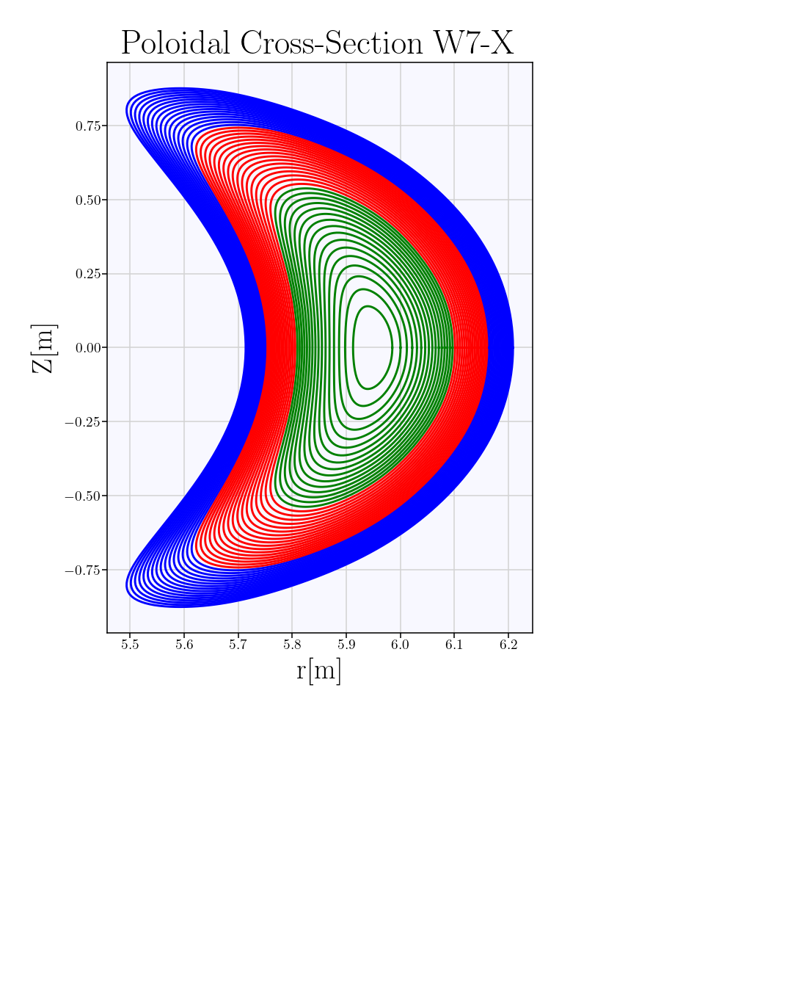

In [23]:
%matplotlib notebook

fig = plt.figure(figsize=(5.5,7))
ax = fig.add_subplot(111)

colors = ['green','red', 'blue']
cmap = ListedColormap(colors)

#Create a colormap
#cmap = cm.get_cmap('plasma_r')

# Plot the lines with varying colors
for i in range(0,n_surf,2):
    color = cmap(i/(100))  # Normalize i to [0, 1]
    ax.plot(X[i,phi_angle,:],Z[i,phi_angle,:],color=color,linewidth=1.5,linestyle="-")

ax.set_xlabel(f'r[m]')
ax.set_ylabel(f'Z[m]')
ax.set_title(f"Poloidal Cross-Section {device}")
ax.set_facecolor('ghostwhite')

ax.xaxis.set_tick_params(labelsize=10,pad=1)
ax.yaxis.set_tick_params(labelsize=10,pad=1)
plt.show()

In [12]:
plt.savefig(f"{device}/Poloidal_CS_{phi_angle}_device_{device}_inyection.png",dpi=500)

RuntimeError: latex was not able to process the following string:
b'Poloidal Cross-Section TJ-II_new'

Here is the full report generated by latex:
This is pdfTeX, Version 3.141592653-2.6-1.40.22 (TeX Live 2022/dev/Debian) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode

(/home/armitage/.cache/matplotlib/tex.cache/f6107685df5bfd19c7b7e204cf383cd2.te
x
LaTeX2e <2021-11-15> patch level 1
L3 programming layer <2022-01-21>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2021/10/04 v1.4n Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texmf/tex/latex/cm-super/type1ec.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/t1cmr.fd))
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty)
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty))

Package geometry Warning: Over-specification in `h'-direction.
    `width' (5058.9pt) is ignored.


Package geometry Warning: Over-specification in `v'-direction.
    `height' (5058.9pt) is ignored.

) (/usr/share/texlive/texmf-dist/tex/latex/tools/bm.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty)
(/usr/share/texlive/texmf-dist/tex/latex/l3backend/l3backend-dvips.def)
(./f6107685df5bfd19c7b7e204cf383cd2.aux)
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing $ inserted.
<inserted text> 
                $
l.19 {\rmfamily Poloidal Cross-Section TJ-II_
                                             new}
No pages of output.
Transcript written on f6107685df5bfd19c7b7e204cf383cd2.log.




<IPython.core.display.Javascript object>


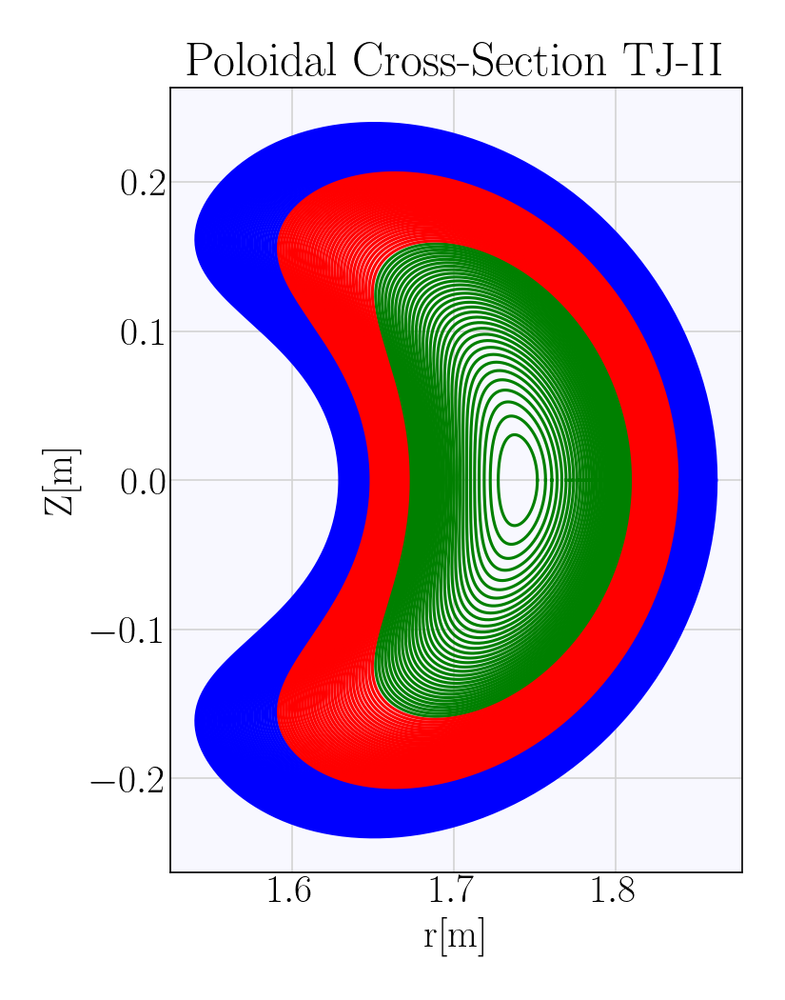

In [12]:
%matplotlib notebook

fig = plt.figure(figsize=(5.5,7))
ax = fig.add_subplot(111)

colors = ['green','red', 'blue']
cmap = ListedColormap(colors)


# Plot the lines with varying colors
for i in range(0,n_surf,1):
    color = cmap(i/(100))  # Normalize i to [0, 1]
    ax.plot(X[i,phi_angle,:],Z[i,phi_angle,:],color=color,linewidth=1.5,linestyle="-")

ax.set_xlabel(f'r[m]')
ax.set_ylabel(f'Z[m]')
ax.set_title(f"Poloidal Cross-Section TJ-II")
ax.set_facecolor('ghostwhite')

ax.xaxis.set_tick_params(labelsize=10,pad=1)
ax.yaxis.set_tick_params(labelsize=10,pad=1)
ax.tick_params(axis='both', which='both', length=0, labelsize=20)

plt.show()

In [13]:
plt.savefig(f"{device}/Poloidal_CS_{phi_angle}_device_{device}_inyection_opt.png",dpi=500)